### Nama : Febrian Dani Ritonga
### Kelas : 3H
### NIM : 2141720070
### WEEK 11,

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### PRAKTIKUM

In [10]:
import cv2 as cv
import cv2
import matplotlib.pyplot as plt
import os
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image

#### 2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

In [13]:

cnb='/content/drive/MyDrive/PCVK/week11/Object Detection/cats_and_bunnies.jpg'
ct='/content/drive/MyDrive/PCVK/week11/Object Detection/cat2_templatejpg.jpg'

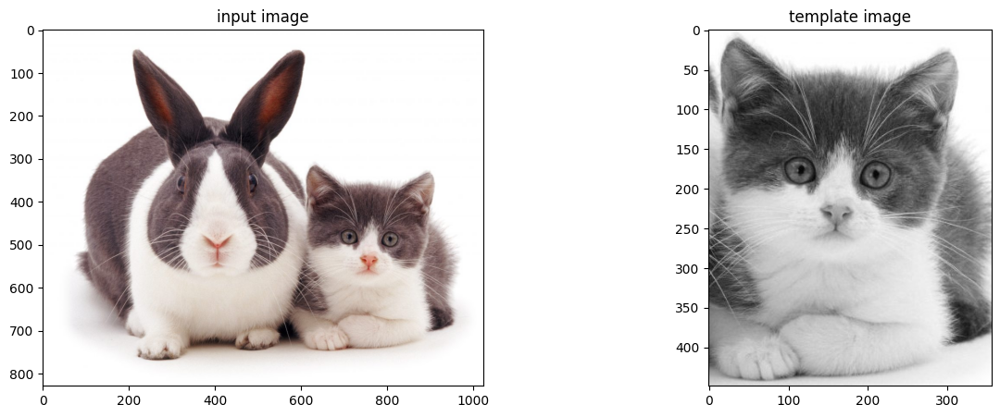

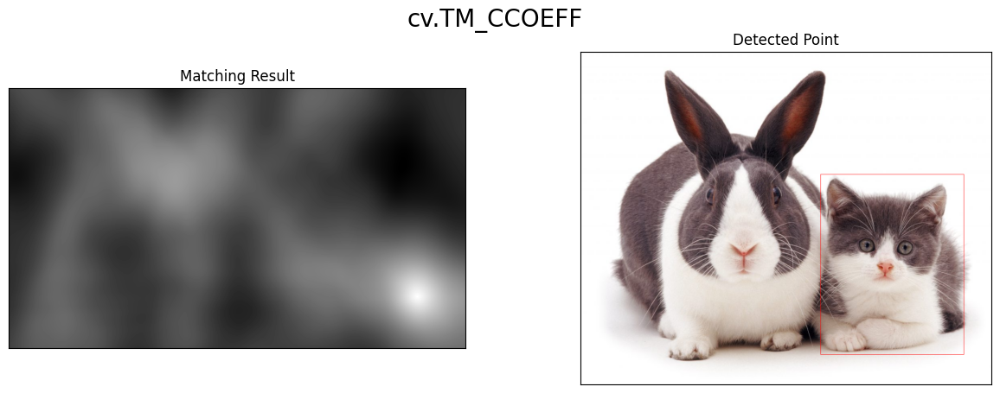

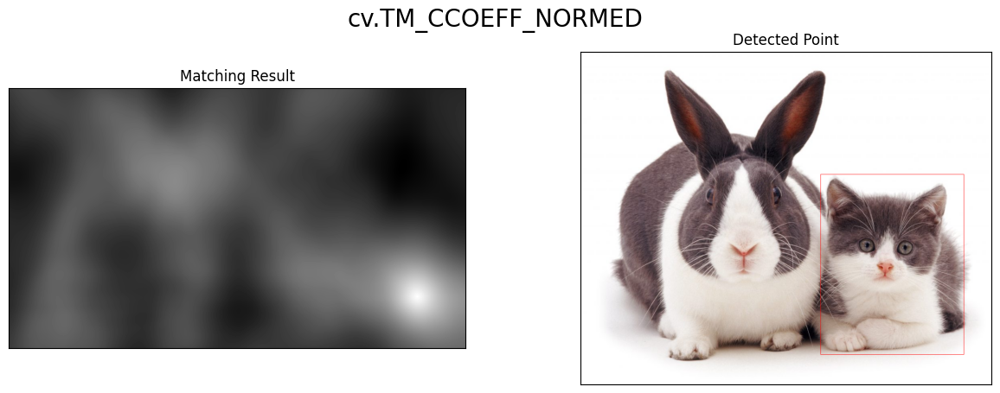

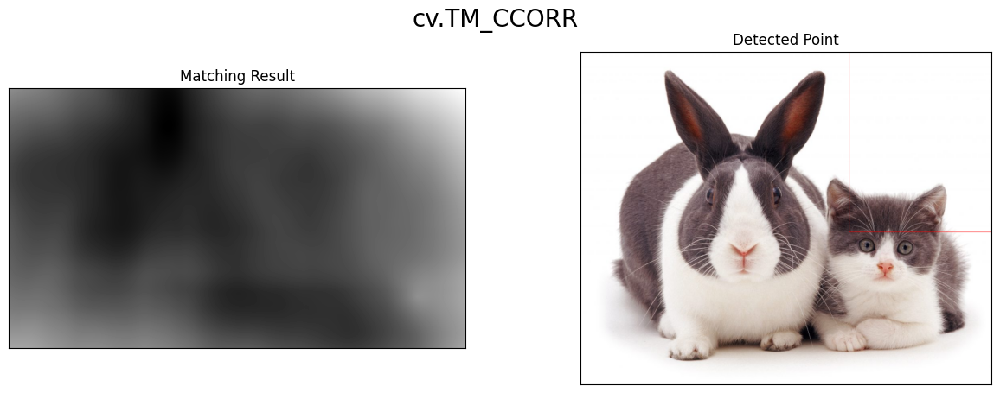

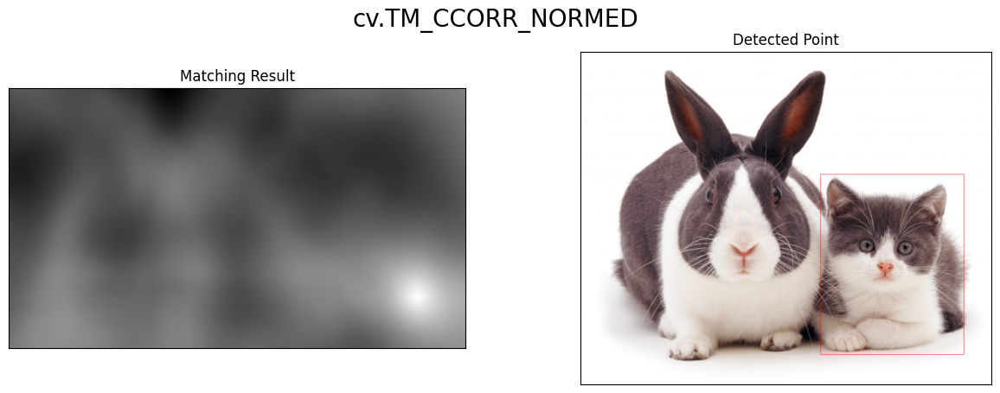

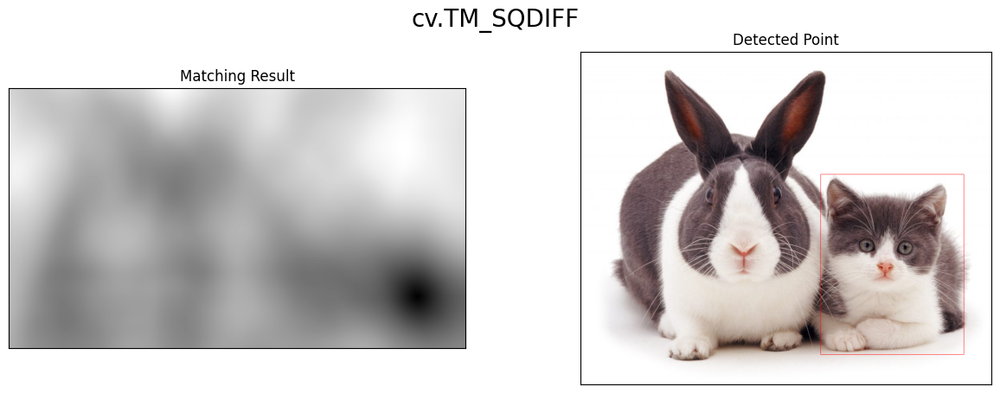

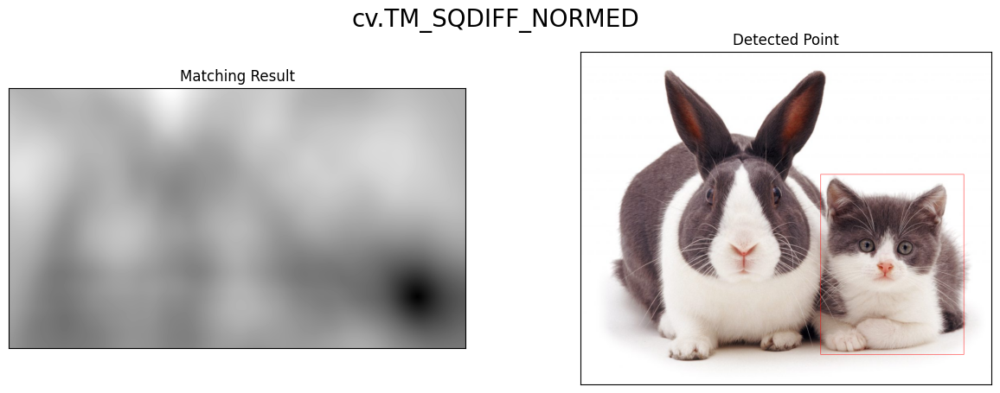

In [14]:
img = cv.imread(cnb)
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread(ct,0)
# dimensi citra
w, h = template.shape[::-1]

# print input image dan template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

#### 3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template.

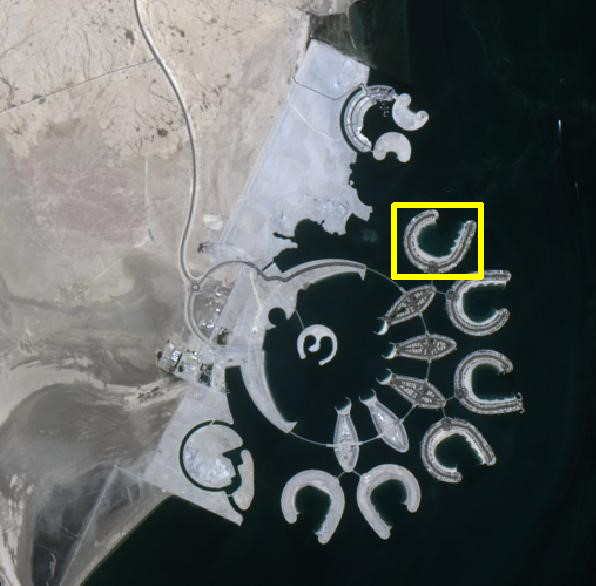

In [16]:
from PIL import Image, ImageDraw
from IPython.display import display

def draw_rectangles_on_image(img, rectangles):
    img_with_rectangles = img.copy()
    draw = ImageDraw.Draw(img_with_rectangles)

    for rect in rectangles:
        x, y, width, height = rect
        draw.rectangle([x, y, x + width, y + height], outline="yellow", width=2)

    return img_with_rectangles

def template_matching_multiple_objects(img, template):
    img_array = np.array(img)
    template_array = np.array(template)

    img_gray = img_array.mean(axis=-1)
    template_gray = template_array.mean(axis=-1)

    img_height, img_width = img_gray.shape
    template_height, template_width = template_gray.shape

    threshold = 0.8

    matches = []

    for i in range(img_height - template_height + 1):
        for j in range(img_width - template_width + 1):
            region_of_interest = img_gray[i:i+template_height, j:j+template_width]

            correlation = np.corrcoef(template_gray.flatten(), region_of_interest.flatten())[0, 1]

            if correlation > threshold:
                matches.append((j, i, template_width, template_height))

    return matches

# Load citra masukan dan template
input_image = Image.open('/content/drive/MyDrive/PCVK/week11/Object Detection/bahrain.jpg')
template_image = Image.open('/content/drive/MyDrive/PCVK/week11/Object Detection/bahrain-template.jpg')

# Cari kecocokan template
matching_coords = template_matching_multiple_objects(input_image, template_image)

# Gambar kotak berwarna kuning pada citra masukan
output_image = draw_rectangles_on_image(input_image, matching_coords)

# Tampilkan gambar langsung di notebook
display(output_image)


#### 4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg.

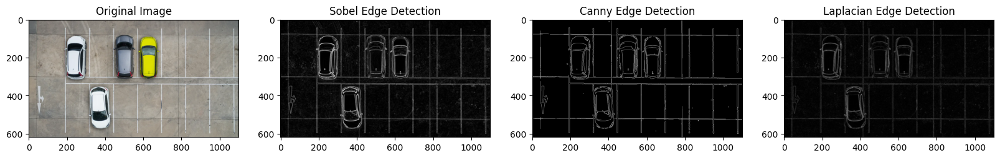

In [17]:
img0 = cv.imread('/content/drive/MyDrive/PCVK/week11/Object Detection/car-park.jpg')
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)
img = cv.GaussianBlur(gray, (3, 3), 0)

img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

edges_canny = cv.Canny(img, 100, 200)

img_laplacian = cv.Laplacian(img, cv.CV_64F)
img_laplacian = cv.convertScaleAbs(img_laplacian)

f, axarr = plt.subplots(1, 4, figsize=(20, 5))

axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('Original Image')

axarr[1].imshow(img_sobelxy, cmap='gray')
axarr[1].set_title('Sobel Edge Detection')

axarr[2].imshow(edges_canny, cmap='gray')
axarr[2].set_title('Canny Edge Detection')

axarr[3].imshow(img_laplacian, cmap='gray')
axarr[3].set_title('Laplacian Edge Detection')

plt.show()

#### 5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chess-board.jpg

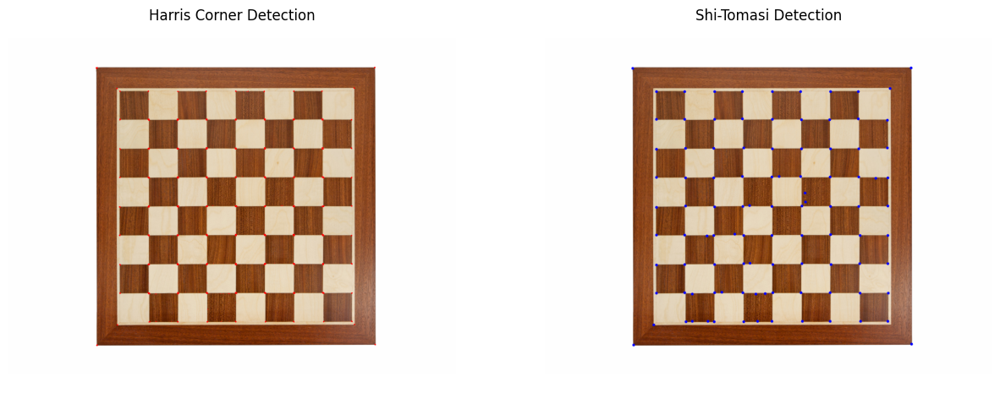

In [20]:
def harris_corner_detection(image_path):
    # Load citra input
    input_img = cv.imread(image_path)
    gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
    dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

    gray_img = np.float32(gray_img)
    harris_output = cv.cornerHarris(gray_img, 2, 3, 3)
    # Hasil harris corner dilakukan dilasi untuk menandai sudut
    harris_output = cv.dilate(harris_output, None)

    # Threshold untuk mengoptimalkan nilai
    input_img[dst > 0.01 * dst.max()] = [0, 0, 255]

    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
    plt.title('Harris Corner Detection')
    plt.axis('off')

def shi_tomasi_detection(image_path):
    # Baca gambar
    img = cv.imread(image_path)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Metode Shi-Tomasi Detection
    corners = cv.goodFeaturesToTrack(gray, 100, 0.01, 10)

    # Konversi koordinat titik sudut ke bilangan bulat
    corners = np.int0(corners)

    # Gambar lingkaran pada setiap sudut yang ditemukan
    for corner in corners:
        x, y = corner.ravel()
        cv.circle(img, (x, y), 3, 255, -1)

    # Tampilkan hasil Shi-Tomasi Detection
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Shi-Tomasi Detection')
    plt.axis('off')

# Jalankan Harris Corner Detection dan Shi-Tomasi Detection
plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
harris_corner_detection('/content/drive/MyDrive/PCVK/week11/Object Detection/chess-board.jpg')

plt.subplot(1, 2, 2)
shi_tomasi_detection('/content/drive/MyDrive/PCVK/week11/Object Detection/chess-board.jpg')

# Menampilkan kedua hasil deteksi
plt.show()

#### 6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan teori

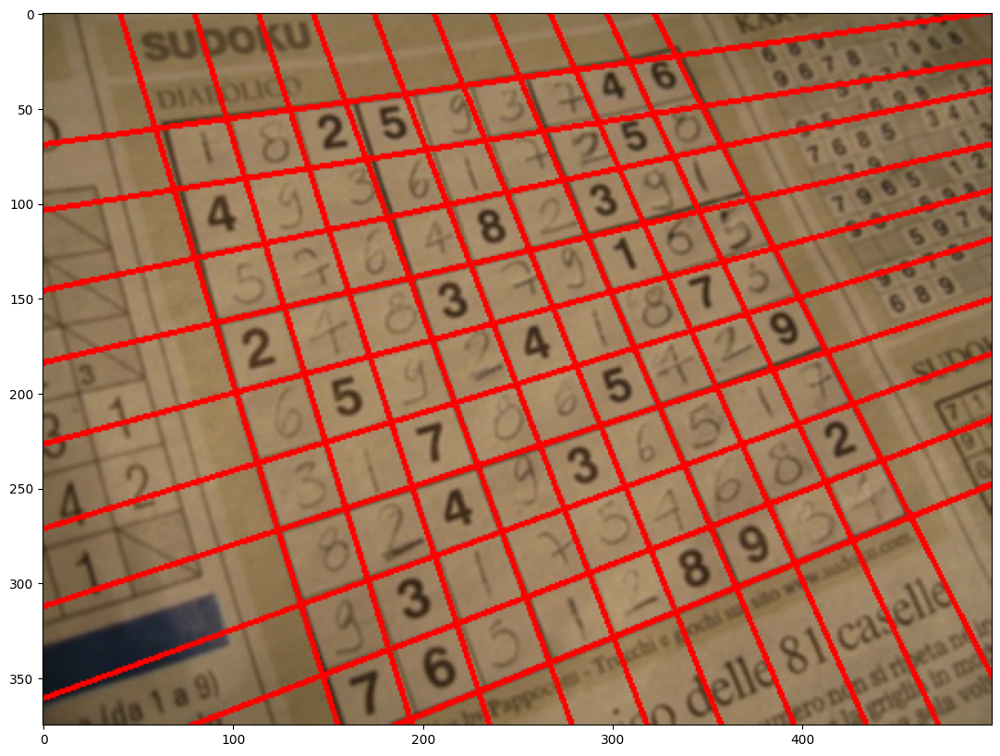

In [22]:
input_img = cv.imread('/content/drive/MyDrive/PCVK/week11/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)


if not lines.any():
    print('No lines found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

#### 7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg

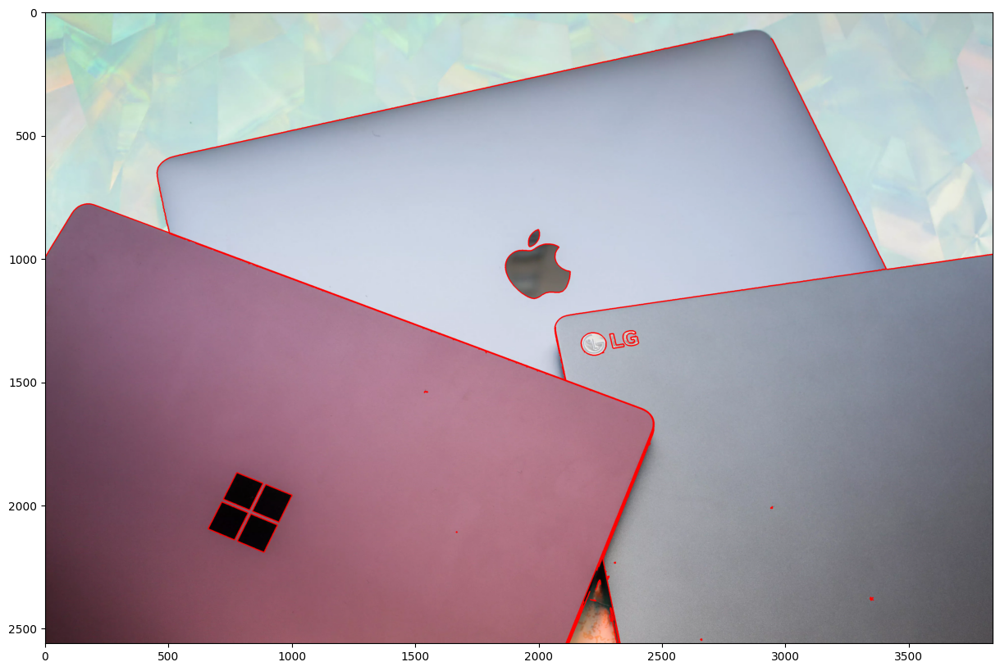

In [23]:
img = cv.imread('/content/drive/MyDrive/PCVK/week11/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))


#### **E. Pengayaan Materi KTP**

141.0 (488, 800)


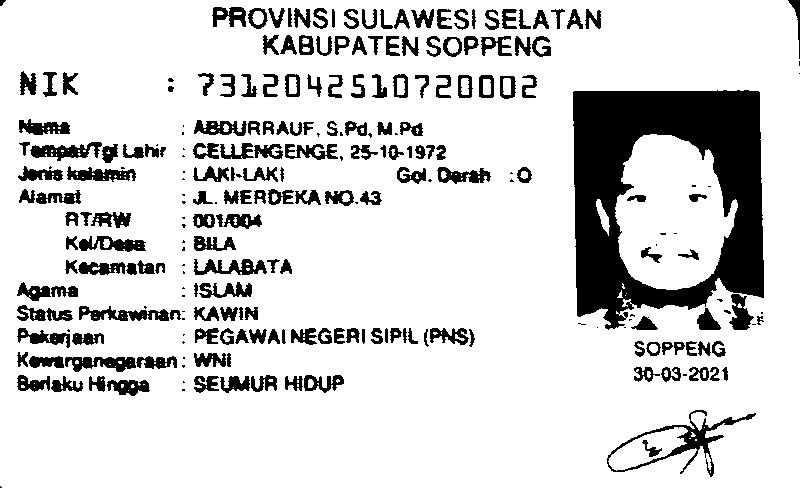

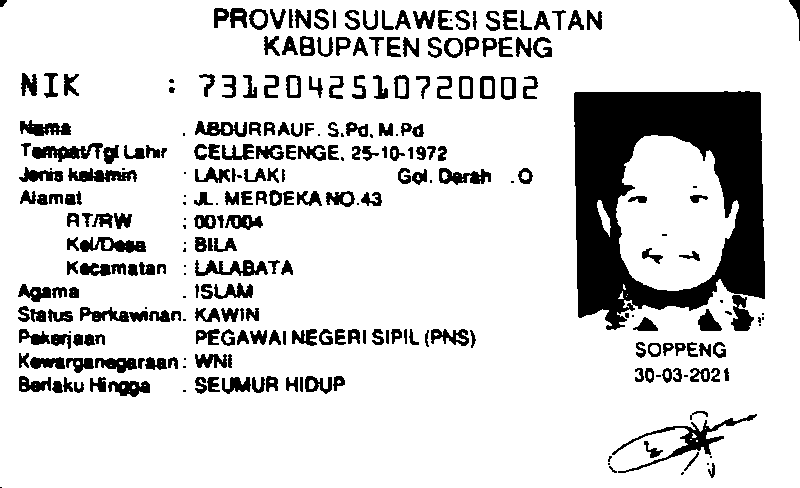

156.0 (680, 1055)


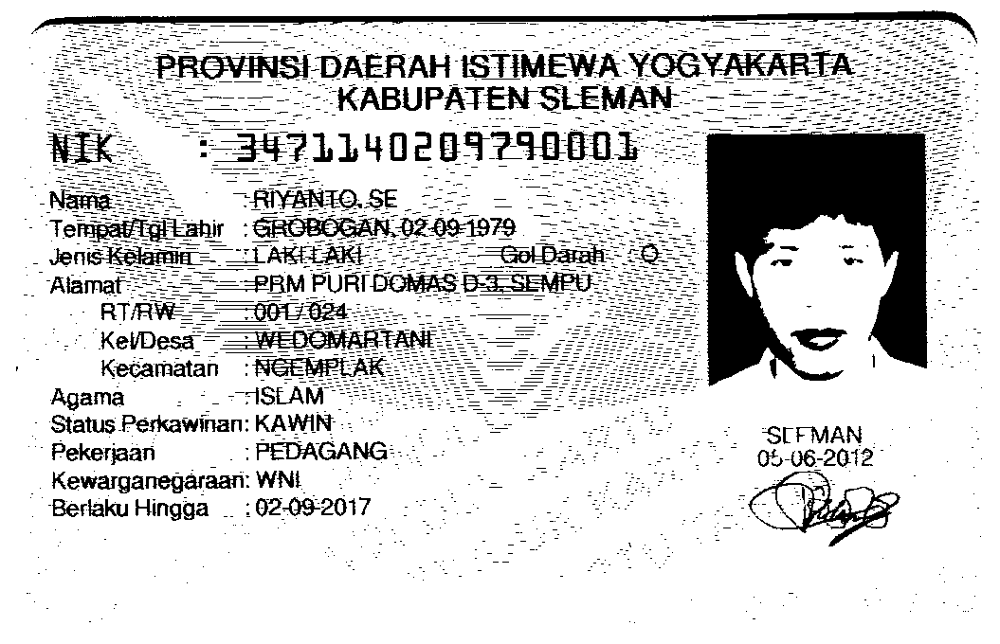

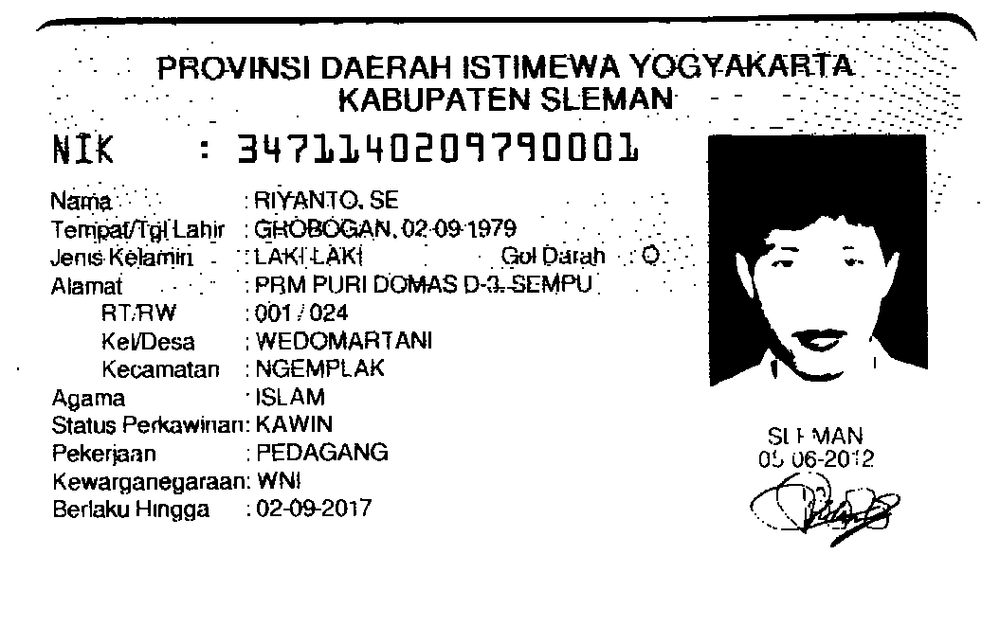

88.0 (338, 600)


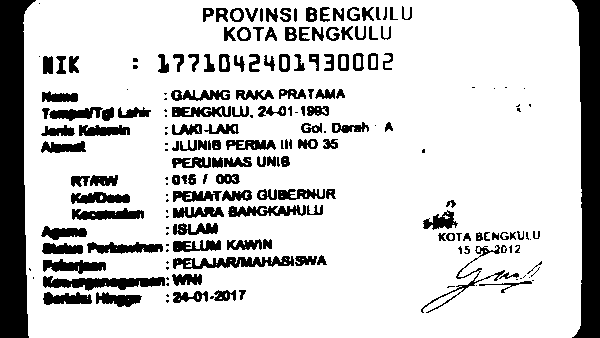

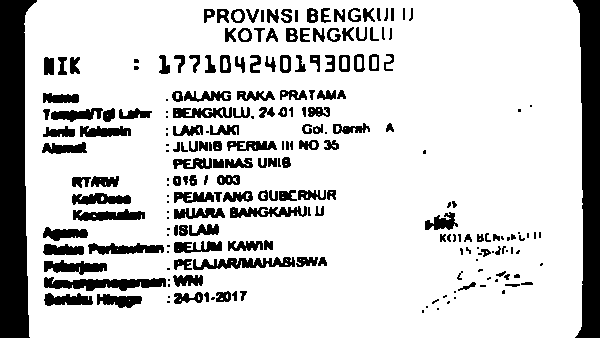

144.0 (707, 1070)


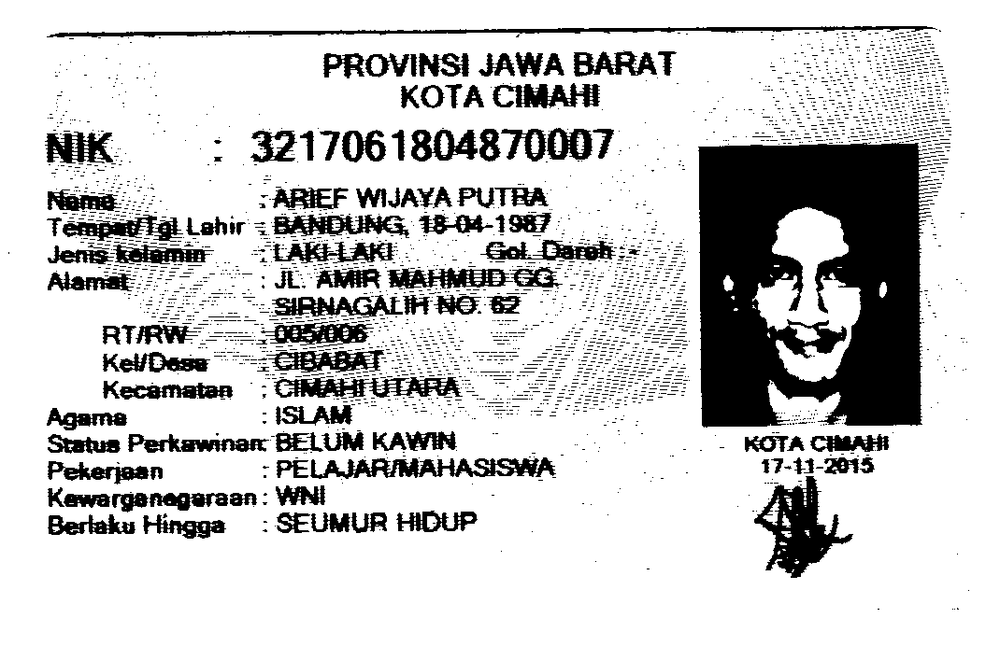

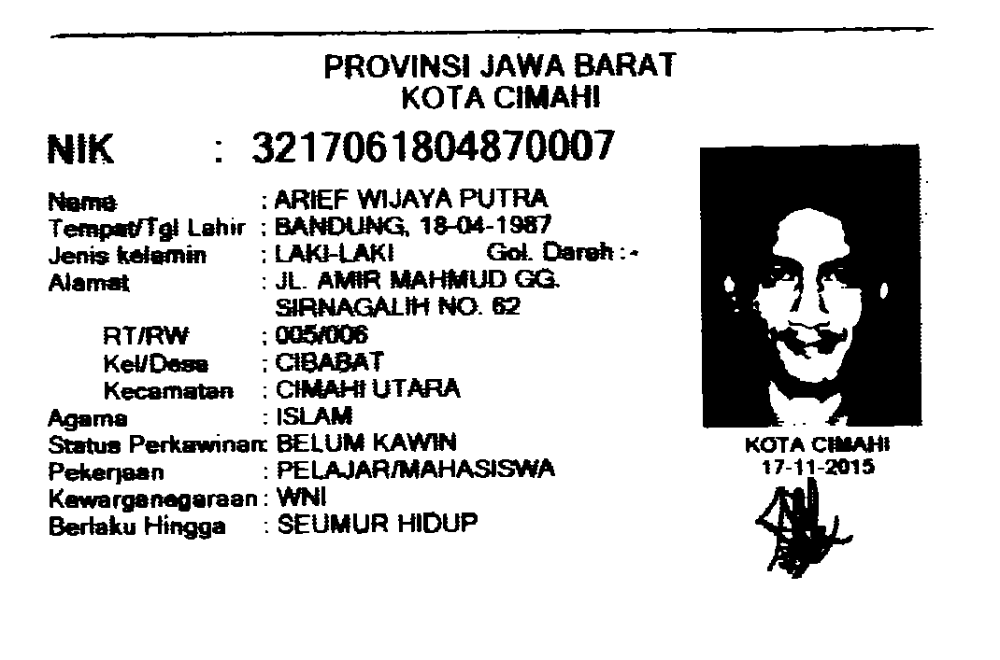

168.0 (300, 493)


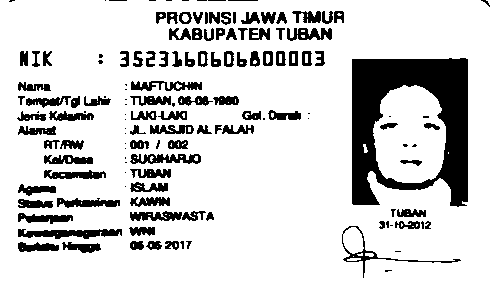

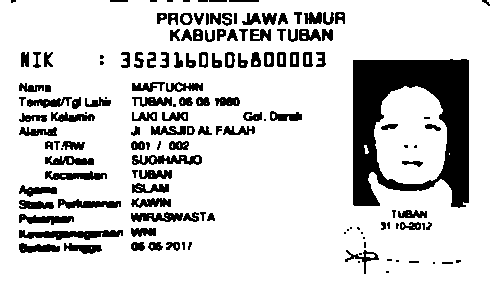

168.0 (300, 493)


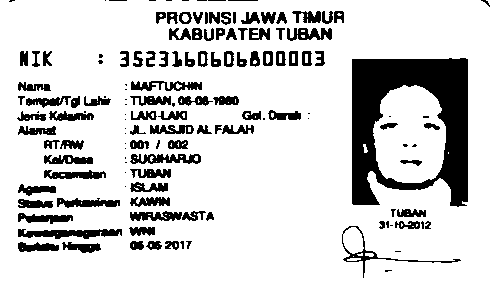

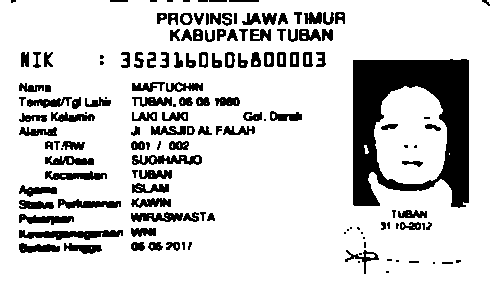

140.0 (381, 608)


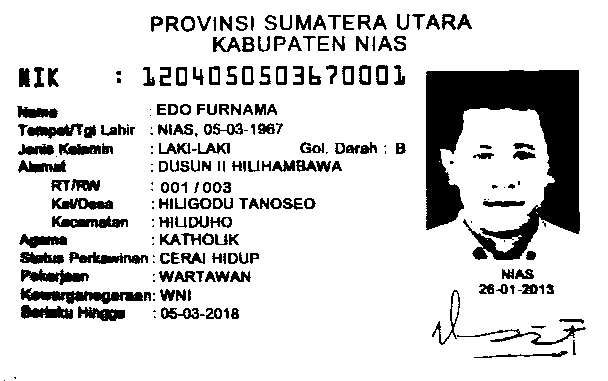

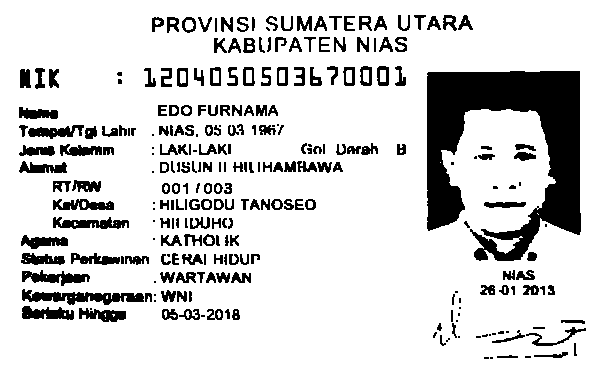

160.0 (636, 996)


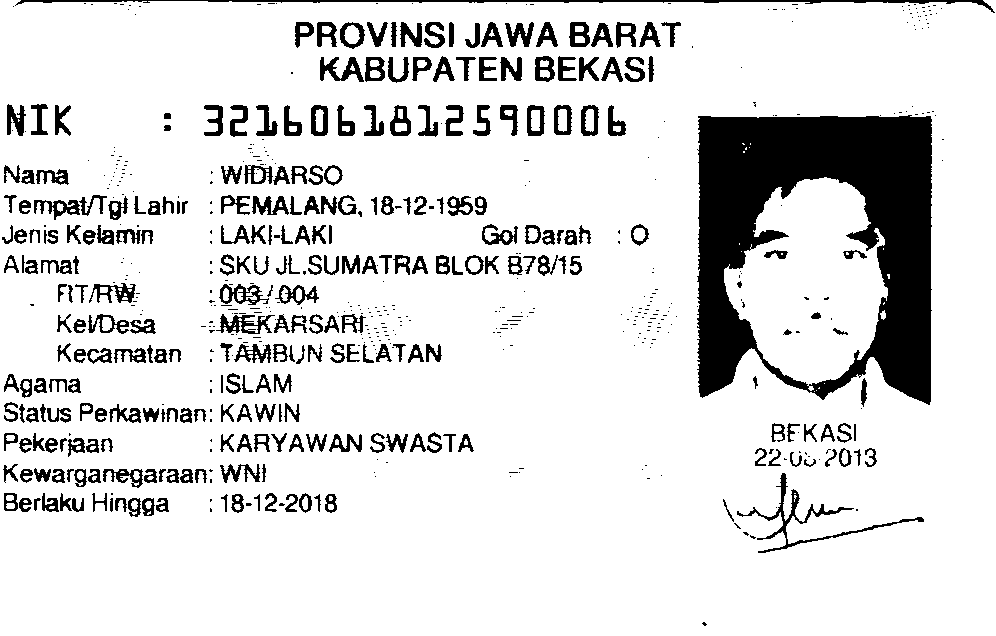

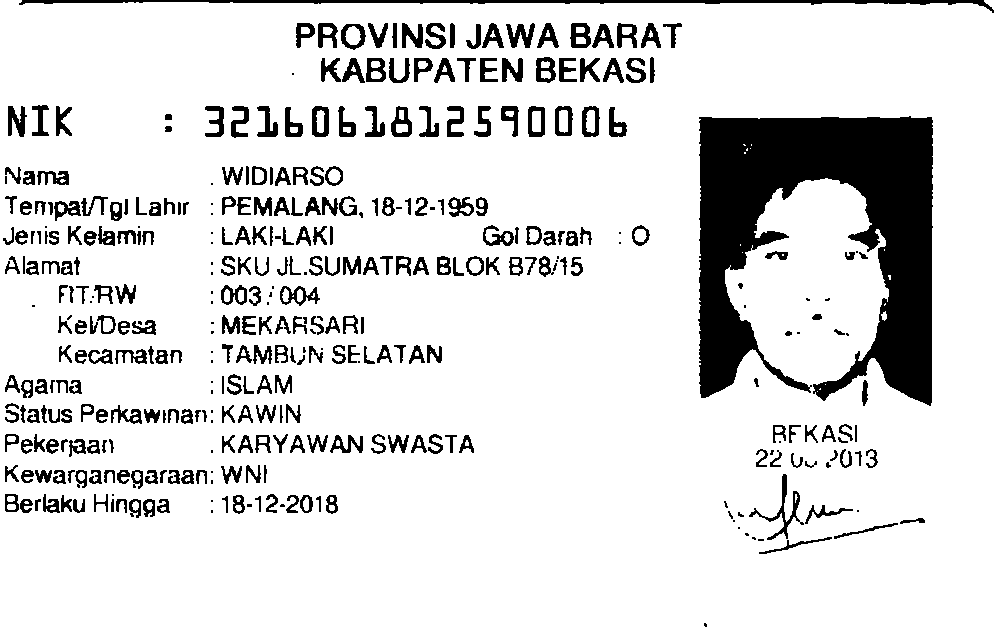

In [26]:
from google.colab.patches import cv2_imshow

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/PCVK/Week8/KTP_More"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv.imread(os.path.join(path_plate, name_file))
  blurred = src.copy()
  gray = blurred.copy()

  # Filtering
  for i in range(10):
    blurred = cv.GaussianBlur(src, (5, 5), 0.5)

  # Ubah ke grayscale
  gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
  ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
  print(ret, bw.shape)
  cv2_imshow(bw)

  kernel = np.ones((2,2),np.uint8)
  close = cv.morphologyEx(bw,cv.MORPH_CLOSE, kernel)
  cv2_imshow(close)



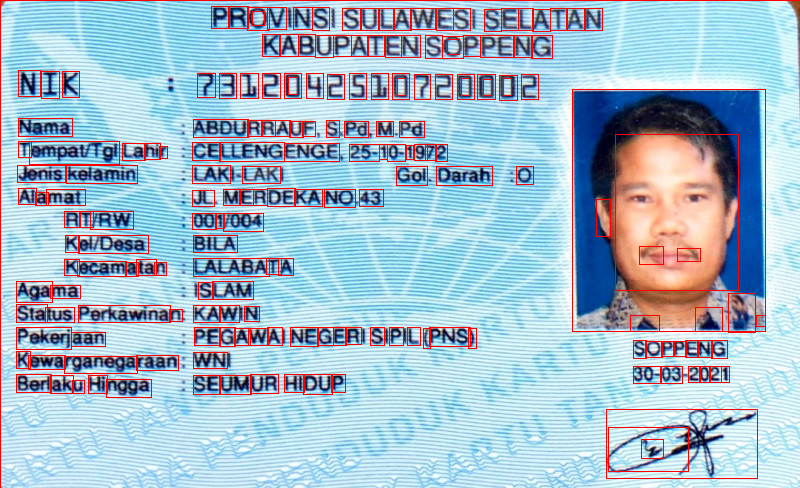

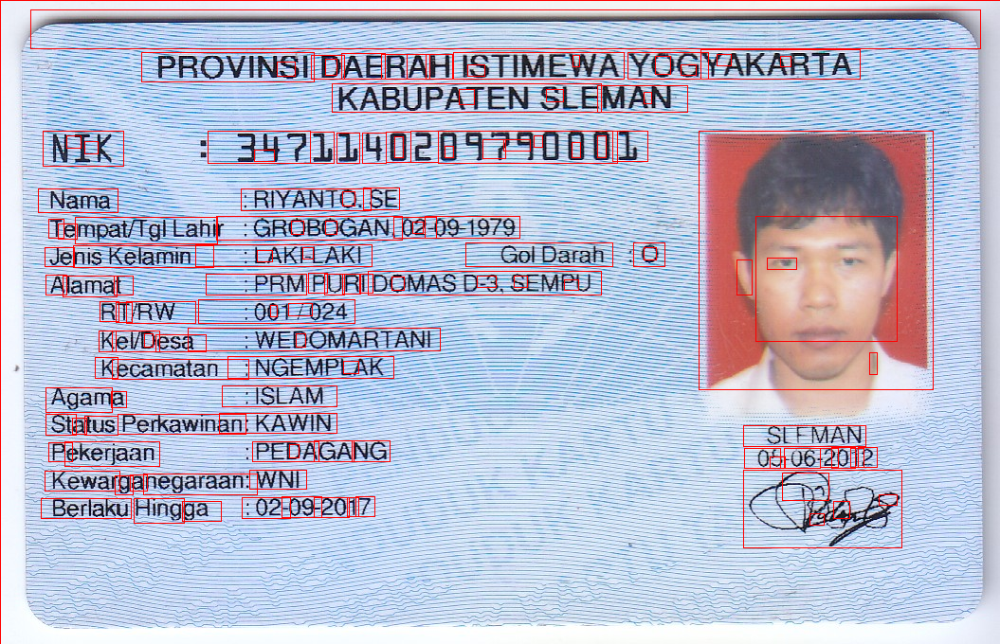

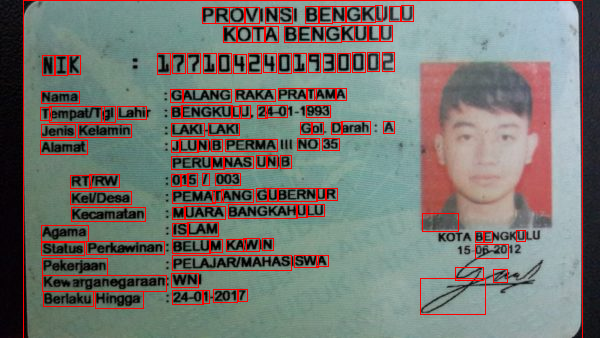

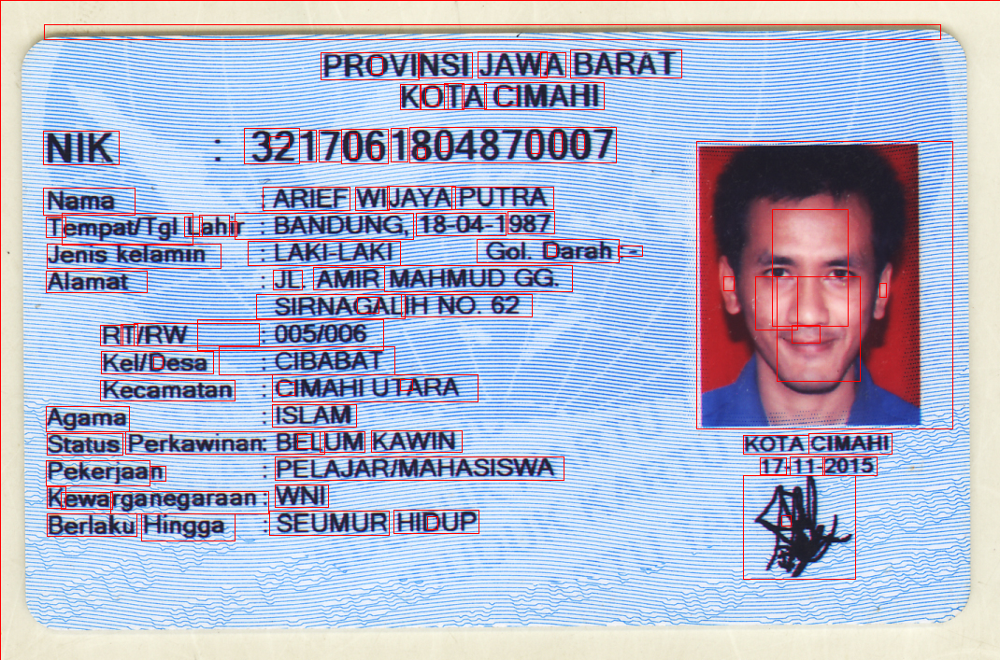

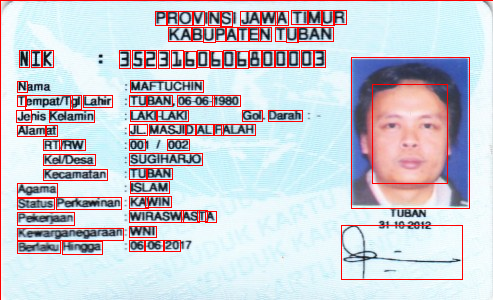

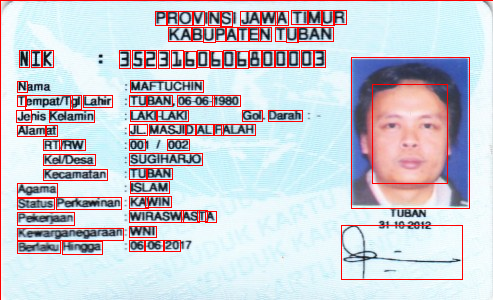

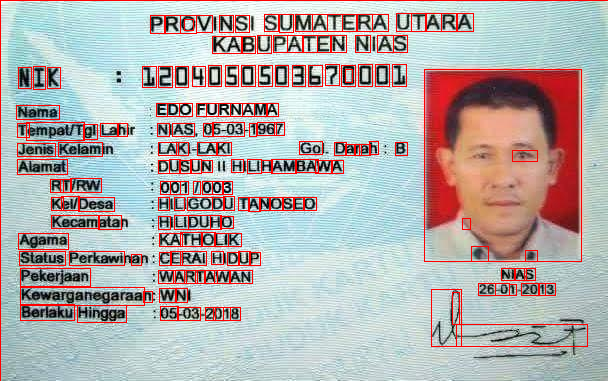

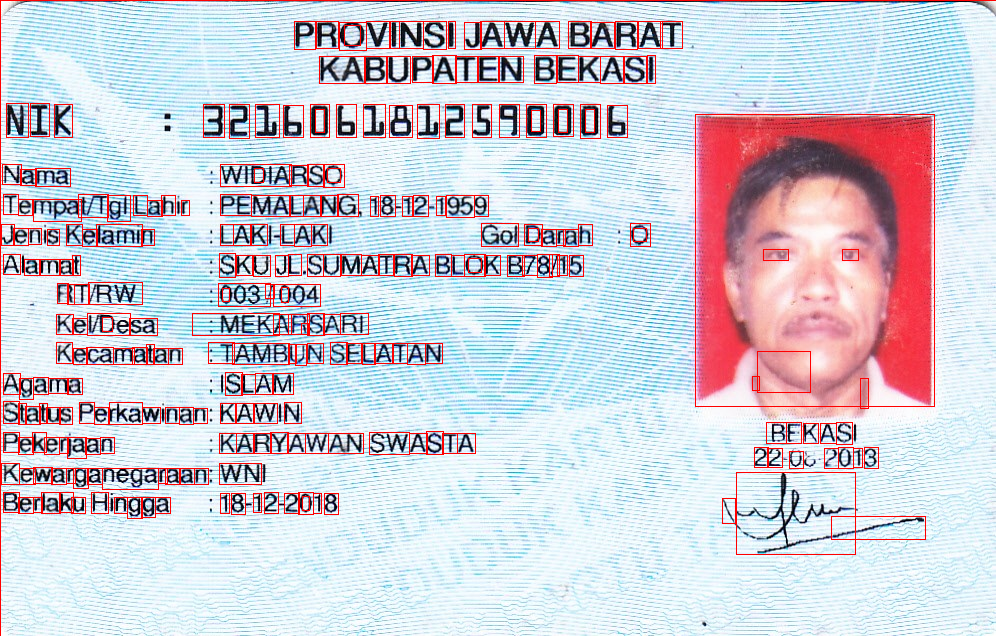

In [27]:
def extract_contour(image):
  blurred = image.copy()

  # Filtering
  for i in range(10):
    blurred = cv.GaussianBlur(image, (5, 5), 0.5)

  img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

  ret, bw = cv.threshold(img_gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

  ret, thresh1 = cv.threshold(bw, 150, 255, cv.THRESH_BINARY)
  contours, hierarchy2 = cv.findContours(thresh1, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

  for contour in contours:
    x, y, w, h = cv.boundingRect(contour)
    if w > 6 and h > 10:
      image_2 = cv.rectangle(image, (x, y), (x+w, y+h),(0,0,255),1)

  return image_2

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/PCVK/Week8/KTP_More"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv.imread(os.path.join(path_plate, name_file))
  image = src.copy()

  image_2 = extract_contour(image)

  cv2_imshow(image_2)

### TUGAS

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP
untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing
yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah.

##### KELOMPOK 2


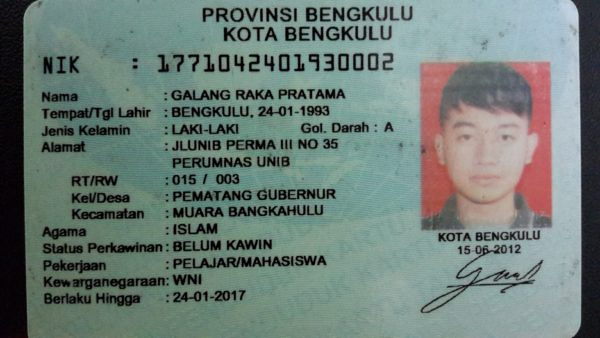

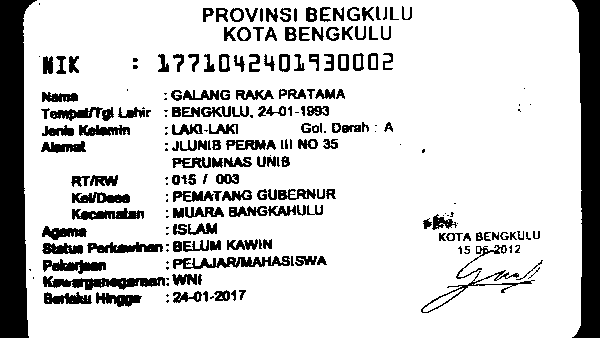

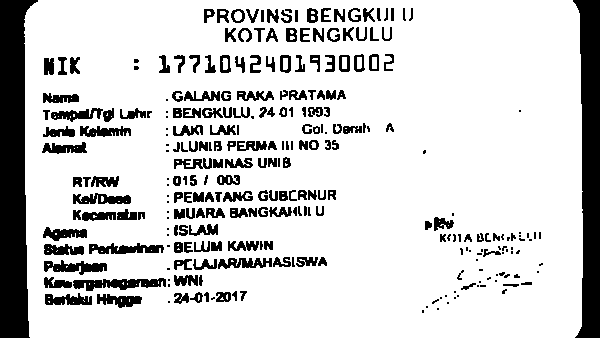

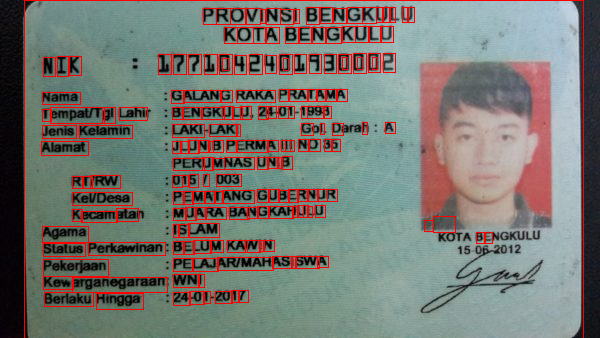

In [28]:
from skimage import morphology

ktp = cv.imread('/content/drive/MyDrive/PCVK/Week8/KTP_More/ktp1.png')

blurred = cv.GaussianBlur(ktp, (21,21), 0.5)

sharpened2 = cv.addWeighted(ktp, 1.5, blurred,-0.5,0)
cv2_imshow(sharpened2)

gray2 = cv.cvtColor(sharpened2, cv.COLOR_BGR2GRAY)


ret2, bw2 = cv.threshold(gray2, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
# print(ret, bw.shape)

cv2_imshow(bw2)

kernel = np.ones((2,2),np.uint8)

morphology = cv.morphologyEx(bw2, cv.MORPH_CLOSE, kernel)

cv2_imshow(morphology)


contours2, _ = cv.findContours(morphology, cv.RETR_TREE, cv.CHAIN_APPROX_NONE)

for contour in contours2:
  x, y, w, h = cv.boundingRect(contour)
  if(w>3 and h>10):
    result2 = cv.rectangle(ktp, (x, y), (x+w, y+h),(0,0,255),1)

cv2_imshow(result2)